<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Task" data-toc-modified-id="Task-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Task</a></span></li><li><span><a href="#Dataset" data-toc-modified-id="Dataset-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Dataset</a></span></li><li><span><a href="#Naive-baseline" data-toc-modified-id="Naive-baseline-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Naive baseline</a></span><ul class="toc-item"><li><span><a href="#Metrics" data-toc-modified-id="Metrics-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Metrics</a></span></li></ul></li><li><span><a href="#Simple-model" data-toc-modified-id="Simple-model-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Simple model</a></span></li><li><span><a href="#Model-that-can-read" data-toc-modified-id="Model-that-can-read-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Model that can read</a></span></li><li><span><a href="#GridSearch-for-model-parameters" data-toc-modified-id="GridSearch-for-model-parameters-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>GridSearch for model parameters</a></span></li></ul></div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('muted')
sns.set_color_codes('muted')
sns.set_style('white')

In [2]:
%config InlineBackend.figure_format = 'retina'

Seminar plan:
1. Underfitting and overfitting.
2. Quality metrics (precision/recall/F1/...)
3. Grid Search & friends
4. (probably) Time-aware model validation

# Task

https://youtrack.jetbrains.com/issues/IDEA

Predict the issue type at the moment when the new issue is reported

Process model:

1. External users create a new issue. They specify its summary and description. Author ID and creation date are recorded automatically. For simplicity, we think that summary and description cannot be changed since then.
1. At some point in time issue becomes resolved. We're interested in the value of the Priority field at this moment. Again, for simplicity we suppose that the value of the Priority field did not change since then.

Therefore everything we need is `id`, `reporter`, `created`, `summary` and `description` of all resolved IDEA issues that were created by an external user.

# Dataset

Scraped from https://youtrack.jetbrains.com/issues/IDEA

In [3]:
df = pd.read_json('../data/issues.json.zip', lines=True)

In [4]:
df.sample(5)

,summary,idReadable,commentsCount,reporter,comments,customFields,created,description,id,$type
70585,Cant search by Spotlight on OS X,IDEA-157702,0,"{'login': 'JonasGao', '$type': 'User'}",[],"[{'value': {'name': 'Normal', '$type': 'EnumBu...",1466498985497,i cant search idea by spotlight on OS X,25-1233914,Issue
55178,"fsnotifier is 32-bit only, missing 64-bit vers...",IDEA-132030,0,"{'login': 'speck', '$type': 'User'}",[],"[{'value': {'name': 'Normal', '$type': 'EnumBu...",1414506456507,The fsnotifier is 32-bit only (missing 64-bit)...,25-773789,Issue
40898,Autocomplete suggests duplicate attributes in ...,IDEA-107526,0,"{'login': 'Jesper.Öqvist', '$type': 'User'}",[],"[{'value': {'name': 'Normal', '$type': 'EnumBu...",1369051616711,In the XML editor the completion suggestions c...,25-556302,Issue
25225,Preview doesn't work with JDK 1.7,IDEA-80926,0,"{'login': 'Slava.Prisivko', '$type': 'User'}",[],"[{'value': {'name': 'Major', '$type': 'EnumBun...",1328559388565,For the attached below layout XML scheme I hav...,25-382598,Issue
24381,Deleted Plugins Remain in the Plugin Manager's...,IDEA-79624,4,"{'login': 'lowbit', '$type': 'User'}","[{'author': {'login': 'anet', 'name': 'Anna Ko...","[{'value': {'name': 'Major', '$type': 'EnumBun...",1325692131080,I've recently deleted a few installed plugins ...,25-376917,Issue


In [5]:
!pip install sklearn_pandas

In [6]:
from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import FunctionTransformer

In [7]:
# the code in this cell is less readable, more usable analog of:
# df['type'] = df.customFields.map(lambda x: [cf['value']['name'] for cf in x if cf['name'] == 'Type'][0])
# df['reporter'] = df.reporter.map(lambda x: x['login'])
# df['created'] = pd.to_datetime(df.created, unit='ms')

formatter = DataFrameMapper([
    ('customFields', FunctionTransformer(
        lambda c: c.map(lambda x: [cf['value']['name'] for cf in x if cf['name'] == 'Type'][0])
    ), {'alias': 'type'}),
    ('reporter', FunctionTransformer(lambda c: c.map(lambda x: x['login']))),
    ('created', FunctionTransformer(lambda c: pd.to_datetime(c, unit='ms'))),
    ('summary', None),
    ('description', None),
    (['summary', 'description'], 
     FunctionTransformer(lambda x: x.summary.fillna('') + '\n\n' + x.description.fillna('')),
     dict(alias='text')
    ),
    ('idReadable', None)
], input_df=True, df_out=True)
formatter.fit_transform(df).sample(5)

,type,reporter,created,summary,description,text,idReadable
854,Bug,ldornin,2009-03-12 18:15:32.000,Android plugin completely breaks IDE,"I'm using Mac OS, jdk 1.5 or 1.6, and build 97...",Android plugin completely breaks IDE\n\nI'm us...,IDEA-22251
84449,Feature,Luke.Jacobs,2017-11-07 14:27:09.037,Feature Request: Upgrade the native scratch pa...,"On the right hand side bar there is a ""Databas...",Feature Request: Upgrade the native scratch pa...,IDEA-181798
36323,Bug,damocamo,2013-01-16 02:40:02.510,Never any recent find useages in PHPStorm.,"When searching multiple times, the ""Recent Fin...",Never any recent find useages in PHPStorm.\n\n...,IDEA-99136
36584,Feature,dmerrill42,2013-01-19 12:30:23.369,Feature Request: Keystroke increment/decrement...,"For example, given {monospace}.foo {margin: 1e...",Feature Request: Keystroke increment/decrement...,IDEA-99380
27918,Feature,kirill.safonov,2012-05-02 10:41:50.850,Allow to take memory snapshot,via buttons \n- next to as CPU snapshot in too...,Allow to take memory snapshot\n\nvia buttons \...,IDEA-85531


In [8]:
X = formatter.transform(df)[['idReadable', 'summary', 'description', 'text', 'reporter', 'created']]
X.sample(5)

,idReadable,summary,description,text,reporter,created
42693,IDEA-111261,Bug on rectangular selection paste,Code to reproduce is that:\n{code lang=php}\n<...,Bug on rectangular selection paste\n\nCode to ...,axel.costas.pena,2013-07-30 09:24:41.706
22767,IDEA-77481,"GIT ""Commit and push"" closes commit dialog",*How to reproduce:*\n* Open project that has r...,"GIT ""Commit and push"" closes commit dialog\n\n...",n3o59hf,2011-11-23 13:40:39.399
65304,IDEA-149079,Add option to move file to another change list...,It would be great if you could quickly add the...,Add option to move file to another change list...,d2ab,2015-12-09 13:21:12.555
35983,IDEA-98239,ClassName completion no longer works inside ft...,"""No suggestions""",ClassName completion no longer works inside ft...,taras.tielkes,2012-12-27 15:00:25.027
77566,IDEA-170260,in version control， serach could not support c...,"\nPC-171.3780.47, JRE 1.8.0_112-release-736-b1...",in version control， serach could not support c...,rapenb,2017-03-22 03:27:54.126


In [9]:
y = formatter.transform(df)['type']

In [10]:
y.value_counts(normalize=True)

Bug                                                   0.688420
Feature                                               0.141135
Usability Problem                                     0.098143
Cosmetics                                             0.026260
Performance Problem                                   0.020524
Exception                                             0.013931
Task                                                  0.007261
Support Request                                       0.001829
Configuration Problem                                 0.001115
Meta Issue                                            0.000848
Auto-reported Exception                               0.000324
Security Problem                                      0.000200
Security (deprecated use Security Problem instead)    0.000010
Name: type, dtype: float64

**Q**: which type of the classifier do we need to build, binary or multiclass?

(0.0, 1.0)

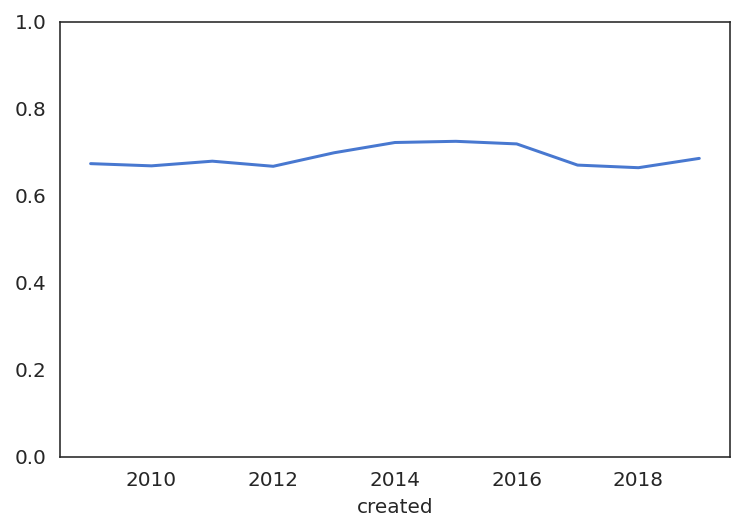

In [11]:
# side question asked: do the share of bugs reduce as long as the product matures?
pd.concat([X.created.dt.year, y == 'Bug'], axis='columns').groupby('created').type.mean().plot()
plt.ylim(0, 1)

In [12]:
y_binary = y == 'Bug'

In [13]:
y_binary.value_counts(normalize=True)

True     0.68842
False    0.31158
Name: type, dtype: float64

# Naive baseline

In [14]:
from sklearn.dummy import DummyClassifier

Naive baseline id a good place to **settle all your evaluation procedures**.

In [15]:
dummy = DummyClassifier(strategy='most_frequent')

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_bin_train, y_bin_test = train_test_split(X, y_binary)

In [17]:
dummy.fit(X_train, y_bin_train)

DummyClassifier(strategy='most_frequent')

In [18]:
dummy.predict(X_train)

array([ True,  True,  True, ...,  True,  True,  True])

## Metrics

In [19]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

**Q**: How does the confusion matrix for the DummyClassifier look like?

**Q**: What are accuracy, precision and recall values for the DummyClassifier?

In [20]:
accuracy_score(y_true=y_bin_train, y_pred=dummy.predict(X_train))

0.6878581138595622

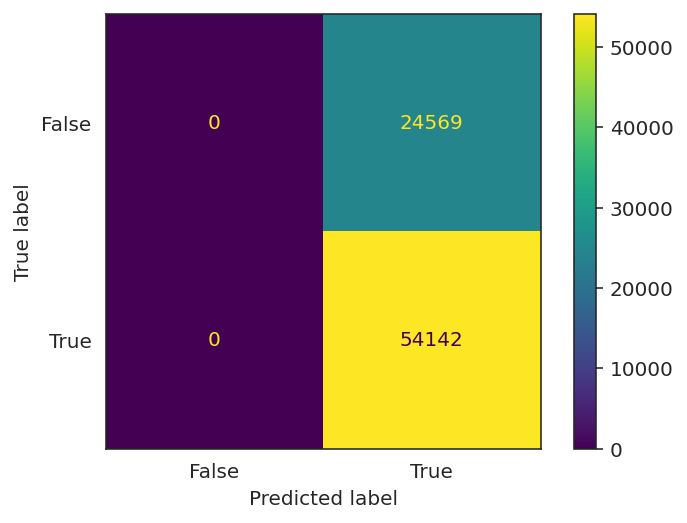

In [21]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(y_true=y_bin_train, estimator=dummy, X=X_train)

# Simple model

In [22]:
import calendar

<AxesSubplot:xlabel='created', ylabel='type'>

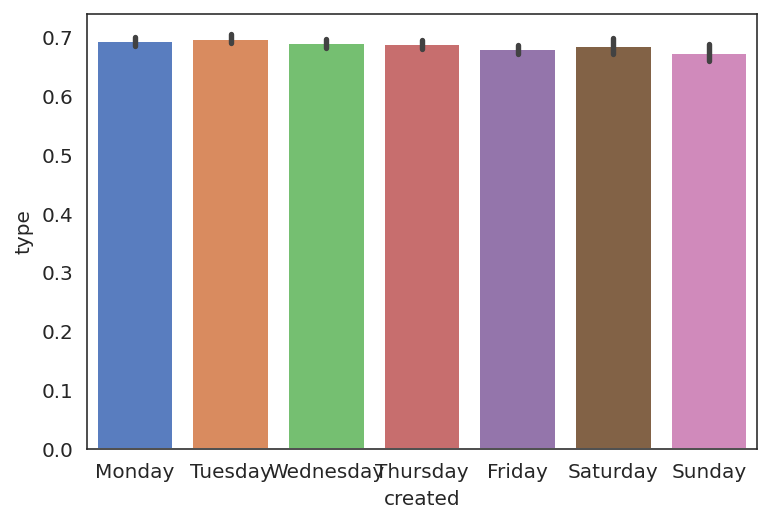

In [23]:
sns.barplot(x=X_train.created.dt.day_name(), y=y_bin_train, order=list(calendar.day_name))

There is a little bit lower probability to file a bug on Sunday. Maybe it can be encoded in a model?

In [24]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
preprocessor = DataFrameMapper([
    ('created', make_pipeline(
        FunctionTransformer(lambda d: d.dt.day_name().to_frame()),
        OneHotEncoder(drop='first')
    ))
], input_df=True, df_out=True)
preprocessor.fit_transform(X_train)

,created_0,created_1,created_2,created_3,created_4,created_5
19170,0.0,0.0,0.0,1.0,0.0,0.0
34368,0.0,0.0,0.0,0.0,1.0,0.0
72604,0.0,0.0,0.0,0.0,0.0,1.0
48783,0.0,1.0,0.0,0.0,0.0,0.0
38114,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
32031,0.0,0.0,1.0,0.0,0.0,0.0
84936,1.0,0.0,0.0,0.0,0.0,0.0
77927,1.0,0.0,0.0,0.0,0.0,0.0
59856,1.0,0.0,0.0,0.0,0.0,0.0


In [25]:
from sklearn.linear_model import LogisticRegression

In [26]:
lr = make_pipeline(preprocessor, LogisticRegression())
lr.fit(X_train, y_bin_train)

Pipeline(steps=[('dataframemapper',
                 DataFrameMapper(df_out=True, drop_cols=[],
                                 features=[('created',
                                            Pipeline(steps=[('functiontransformer',
                                                             FunctionTransformer(func=<function <lambda> at 0x7f8dc9ecd1f0>)),
                                                            ('onehotencoder',
                                                             OneHotEncoder(drop='first'))]))],
                                 input_df=True)),
                ('logisticregression', LogisticRegression())])

**Q**: what is the quality of the day-of-week model?

In [27]:
accuracy_score(y_bin_train, lr.predict(X_train))

0.6878581138595622

(array([ 4306.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0., 13548.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
         4385.,     0.,     0.,     0.,     0.,     0.,     0., 15172.,
            0., 15003.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0., 12288.,     0.,     0.,     0.,     0.,     0.,
            0., 14009.]),
 array([0.67325431, 0.67371731, 0.6741803 , 0.67464329, 0.67510629,
        0.67556928, 0.67603227, 0.67649527, 0.67695826, 0.67742125,
        0.67788425, 0.67834724, 0.67881024, 0.67927323, 0.67973622,
        0.68019922, 0.68066221, 0.6811252 , 0.6815882 , 0.68205119,
        0.68251418, 0.68297718, 0.68344017, 0.68390316, 0.68436616,
        0.68482915, 0.68529214, 0.68575514, 0.68621813, 0.68668113,
        0.68714412, 0.68760711, 0.68807011, 0.6885331 , 0.68899609,
        0.68945909, 0.68992208, 0.69038507, 0.69084807, 0.69131106

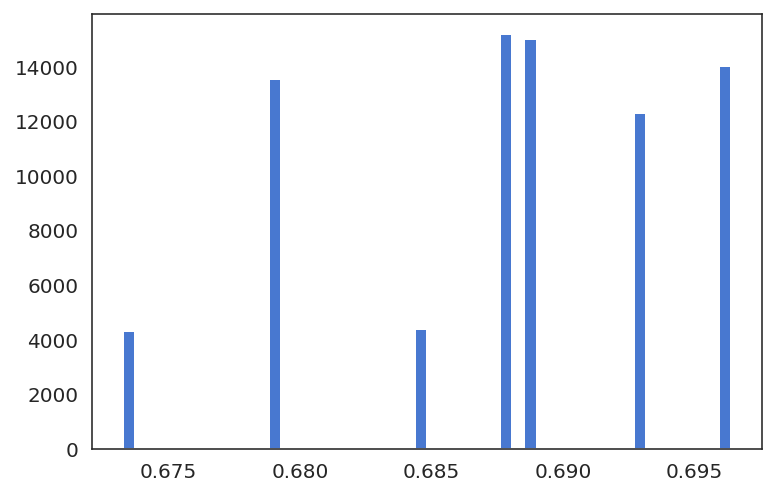

In [28]:
plt.hist(lr.predict_proba(X_train)[:, 1], bins=50)

# Model that can read

We have texts. How can we transform texts to a set of features?

In [29]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [30]:
preprocessor = DataFrameMapper([
    ('text', TfidfVectorizer(
            min_df=.05, stop_words='english', token_pattern=r'[A-Za-z]{2,}'#, max_df=.5, token_pattern=r'[A-Za-z]{2,}', stop_words='english'
    ))
], input_df=True, df_out=True).fit(X_train)
preprocessor.transform(X_train.sample(5))

,text_access,text_add,text_amd,text_application,text_attached,text_bit,text_build,text_built,text_button,text_case,...,text_vm,text_void,text_want,text_way,text_window,text_windows,text_work,text_working,text_works,text_xml
51861,0.023128,0.0,0.0,0.0,0.000000,0.0,0.082377,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.021526,0.0
50360,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
62666,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
71432,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
71134,0.000000,0.0,0.0,0.0,0.212706,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.398905,0.0,0.0,0.0,0.000000,0.0


In [31]:
X_train.shape

(78711, 6)

In [32]:
lr = make_pipeline(preprocessor.set_params(df_out=False), LogisticRegression())
lr.fit(X_train, y_bin_train)

Pipeline(steps=[('dataframemapper',
                 DataFrameMapper(drop_cols=[],
                                 features=[('text',
                                            TfidfVectorizer(min_df=0.05,
                                                            stop_words='english',
                                                            token_pattern='[A-Za-z]{2,}'))],
                                 input_df=True)),
                ('logisticregression', LogisticRegression())])

**Task**: Evaluate the model quality

In [33]:
accuracy_score(y_bin_train, lr.predict(X_train))

0.7368093404987867

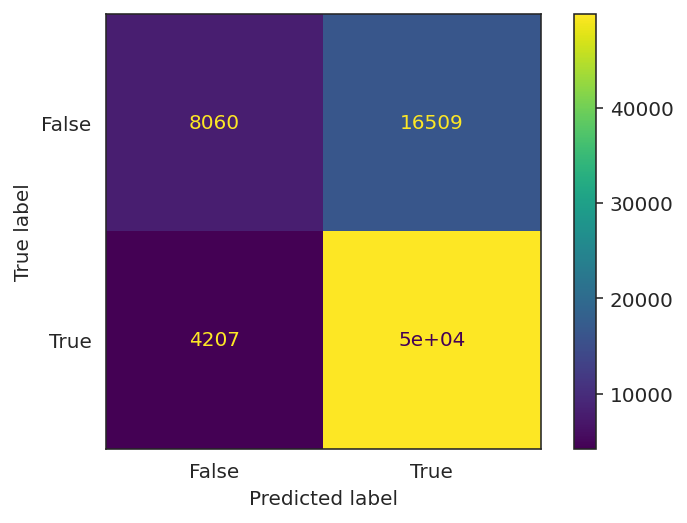

In [34]:
plot_confusion_matrix(y_true=y_bin_train, estimator=lr, X=X_train)

Are we interested in how many actual bugs we identified as bugs? Or is it more important not to load the prioritization engine with unrelated stuff? Or, maybe, the ultimate goal is not to miss any suggestion?

In [35]:
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

In [36]:
precisions, recalls, thresholds = precision_recall_curve(y_true=y_bin_train, probas_pred=lr.predict_proba(X_train)[:,1])

In [37]:
from plotly.express import scatter

In [38]:
scatter(x=recalls[:-1], y=precisions[:-1], text=thresholds)